<a href="https://colab.research.google.com/github/kraseliukts/MachineLearning-activity/blob/main/ML_Tatiana_Kraseliuk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Machine Learning activity.
**Autor: Tatiana Kraseliuk.**

Работаем с [данными](https://raw.githubusercontent.com/obulygin/content/main/SeoulBike/seoul_bike_data.csv) сервиса проката велосипедов в Корее за год.

Описание данных:
- Date - дата;
- Rented Bike Count - сколько велосипедов было взято в прокат, целевая переменная;
- Hour - час дня;
- Temperature - температура воздуха в градусах Цельсия;
- Humidity - влажность воздуха;
- Wind Speed - скорость ветра в м/с;
- Visibility - мера различимости объектов на расстоянии в 10 метров;
- Dew point temperature -  температура, зарегистрированная в начале дня, в градусах Цельсия;
- Solar Radiation - интенсивность солнечного света;
- Rainfall - количество осадков в мм;
- Snowfall - количество выпавшего снега в мм;
- Seasons - время года;
- Holiday - является ли день праздничным;
- Functioning Day - маркер, работал ли сервис проката в указанное время.

## EDA (Exploratory Data Analysis).

In [1]:
pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 9.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 23.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 28.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=a50302beb7226e6c7aee5552fd7f0438a14424a2c6d917d8f2275c4c7bc25c38
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [2]:
# импортируем нужные библиотеки
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import datetime as dt
from pprint import pprint

from ydata_profiling import ProfileReport

In [3]:
# читаем данные
url='https://raw.githubusercontent.com/obulygin/content/main/SeoulBike/seoul_bike_data.csv'
data=pd.read_csv(url, encoding='unicode_escape')
data.head(5)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [5]:
data.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


Преобразуем формат колонки 'Date' в формат datetime.

In [6]:
data['Date'] = pd.to_datetime(data['Date'], format = '%d/%m/%Y').dt.strftime('%Y/%m/%d')
data['Date'] = pd.to_datetime(data['Date']).dt.date
data['Date'] = pd.to_datetime(data['Date'], format='%Y/%m/%d')

Проверим возможные варианты для категориальных значений колонок 'Seasons', 'Holiday', 'Functioning day' и проведем их кодирование.

In [7]:
print(data['Seasons'].value_counts())
print(data['Holiday'].value_counts())
print(data['Functioning Day'].value_counts())

Seasons
Spring    2208
Summer    2208
Autumn    2184
Winter    2160
Name: count, dtype: int64
Holiday
No Holiday    8328
Holiday        432
Name: count, dtype: int64
Functioning Day
Yes    8465
No      295
Name: count, dtype: int64


In [8]:
seasons = pd.get_dummies(data['Seasons'], prefix_sep='_')
seasons = seasons.rename(columns={'Autumn': 'Season_Autumn', 'Spring': 'Season_Spring','Summer': 'Season_Summer','Winter': 'Season_Winter',})
seasons.head()

,Season_Autumn,Season_Spring,Season_Summer,Season_Winter
0,False,False,False,True
1,False,False,False,True
2,False,False,False,True
3,False,False,False,True
4,False,False,False,True


In [9]:
data=pd.concat([data, seasons], axis=1)
#data=data.drop(['Seasons'], axis=1)
data.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Season_Autumn,Season_Spring,Season_Summer,Season_Winter
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,False,False,False,True
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,False,False,False,True
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,False,False,False,True
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,False,False,False,True
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,False,False,False,True


In [10]:
data['Functioning Day'] = data['Functioning Day'].astype('category').cat.codes
data['Holiday'] = data['Holiday'].astype('category').cat.codes
data.Holiday = data.Holiday.replace({1:0, 0:1})

Проверим наличие дублированных значений. Дублированных значений нет.

In [11]:
data_dup = data.drop_duplicates()
print(data_dup.shape)
print(data.shape)

(8760, 18)
(8760, 18)


In [12]:
len(data[data.duplicated()])

0

 Проверим наличие пропущенных данных. Пропущенных данных нет.

In [13]:
for col in data.columns:
    pct_missing = np.mean(data[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

Date - 0%
Rented Bike Count - 0%
Hour - 0%
Temperature(°C) - 0%
Humidity(%) - 0%
Wind speed (m/s) - 0%
Visibility (10m) - 0%
Dew point temperature(°C) - 0%
Solar Radiation (MJ/m2) - 0%
Rainfall(mm) - 0%
Snowfall (cm) - 0%
Seasons - 0%
Holiday - 0%
Functioning Day - 0%
Season_Autumn - 0%
Season_Spring - 0%
Season_Summer - 0%
Season_Winter - 0%


In [14]:
data.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
Season_Autumn                0
Season_Spring                0
Season_Summer                0
Season_Winter                0
dtype: int64

Построим box plot и проверим наличие выбросов в данных. Выбросов в данных не наблюдается.

Text(0.5, 0, 'Snowfall (cm)')

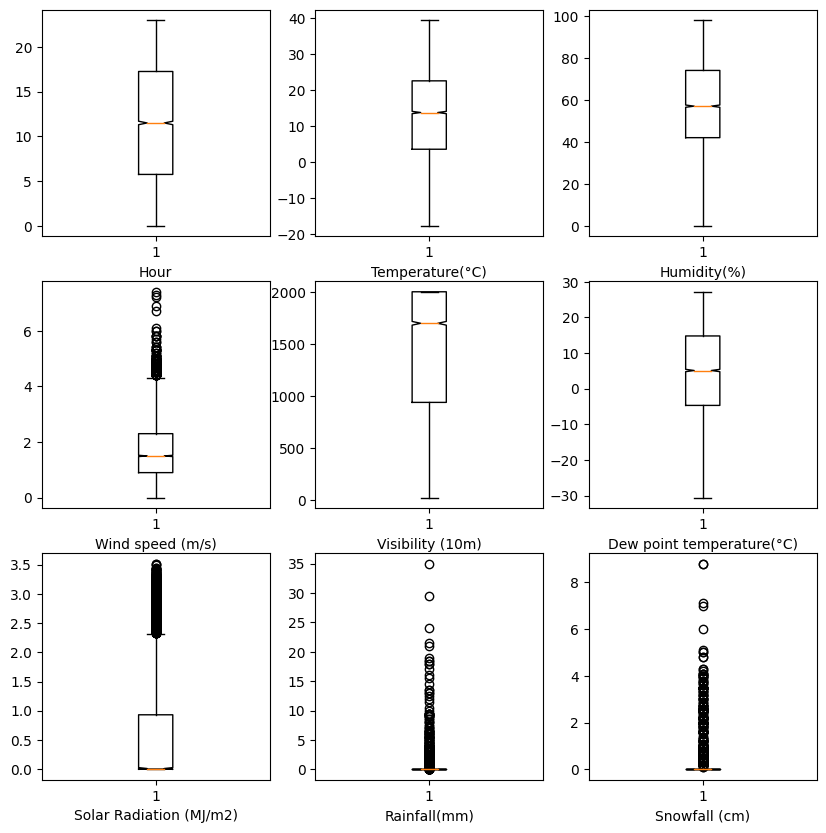

In [15]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10, 10))

axes[0,0].boxplot(x="Hour", data=data, notch = True)
axes[0,0].set_xlabel('Hour')

axes[0,1].boxplot(x="Temperature(°C)", data=data, notch = True)
axes[0,1].set_xlabel('Temperature(°C)')

axes[0,2].boxplot(x="Humidity(%)", data=data, notch = True)
axes[0,2].set_xlabel('Humidity(%)')

axes[1,0].boxplot(x="Wind speed (m/s)", data=data, notch = True)
axes[1,0].set_xlabel('Wind speed (m/s)')

axes[1,1].boxplot(x="Visibility (10m)", data=data, notch = True)
axes[1,1].set_xlabel('Visibility (10m)')

axes[1,2].boxplot(x="Dew point temperature(°C)", data=data, notch = True)
axes[1,2].set_xlabel('Dew point temperature(°C)')

axes[2,0].boxplot(x="Solar Radiation (MJ/m2)", data=data, notch = True)
axes[2,0].set_xlabel('Solar Radiation (MJ/m2)')

axes[2,1].boxplot(x="Rainfall(mm)", data=data, notch = True)
axes[2,1].set_xlabel('Rainfall(mm)')

axes[2,2].boxplot(x="Snowfall (cm)", data=data, notch = True)
axes[2,2].set_xlabel('Snowfall (cm)')

Text(0.5, 0, 'Functioning Day')

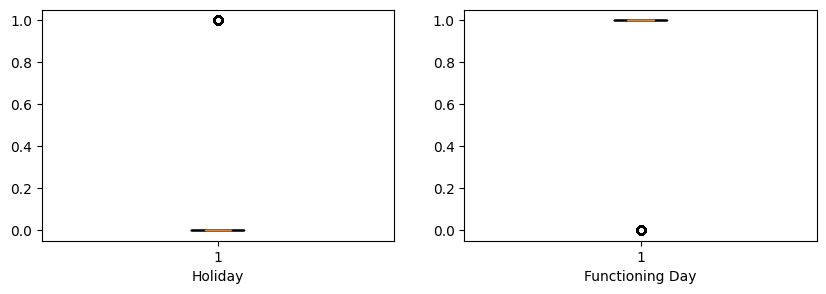

In [16]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 3))

axes[0].boxplot(x="Holiday", data=data, notch = True)
axes[0].set_xlabel('Holiday')

axes[1].boxplot(x="Functioning Day", data=data, notch = True)
axes[1].set_xlabel('Functioning Day')

Создадим 4 новые колонки: год, месяц, день и день недели.

In [17]:
data['Year'] = data['Date'].dt.year
data['Month'] = data['Date'].dt.month
data['Day'] = data['Date'].dt.day
data['Weekday'] = data['Date'].dt.weekday

In [18]:
data=data.astype({'Season_Autumn':'int64','Season_Winter':'int64','Season_Spring':'int64','Season_Summer':'int64'})

In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 22 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date                       8760 non-null   datetime64[ns]
 1   Rented Bike Count          8760 non-null   int64         
 2   Hour                       8760 non-null   int64         
 3   Temperature(°C)            8760 non-null   float64       
 4   Humidity(%)                8760 non-null   int64         
 5   Wind speed (m/s)           8760 non-null   float64       
 6   Visibility (10m)           8760 non-null   int64         
 7   Dew point temperature(°C)  8760 non-null   float64       
 8   Solar Radiation (MJ/m2)    8760 non-null   float64       
 9   Rainfall(mm)               8760 non-null   float64       
 10  Snowfall (cm)              8760 non-null   float64       
 11  Seasons                    8760 non-null   object        
 12  Holida

In [20]:
data.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),...,Holiday,Functioning Day,Season_Autumn,Season_Spring,Season_Summer,Season_Winter,Year,Month,Day,Weekday
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,...,0,1,0,0,0,1,2017,12,1,4
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,...,0,1,0,0,0,1,2017,12,1,4
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,...,0,1,0,0,0,1,2017,12,1,4
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,...,0,1,0,0,0,1,2017,12,1,4
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,...,0,1,0,0,0,1,2017,12,1,4


Построим 3 графика, чтобы оценить:
- кол-во ежедневных поездок в зависимости от типа дня - обычный день/праздник.
- кол-во поездок по месяцам.
- кол-во поездок по дням недели с разделением на праздничный/не праздничный день.

Можем увидеть, что в будние дни 8 утра и 6 вечера - пик поездок. В праздничные дни количество поездок растет постепенно с 5 утра до 6 вечера.
В летние месяцы среднее кол-во поездок выше, чем в другие месяцы.
В не праздничные дни среднее кол-во поездок примерно одинаковое.

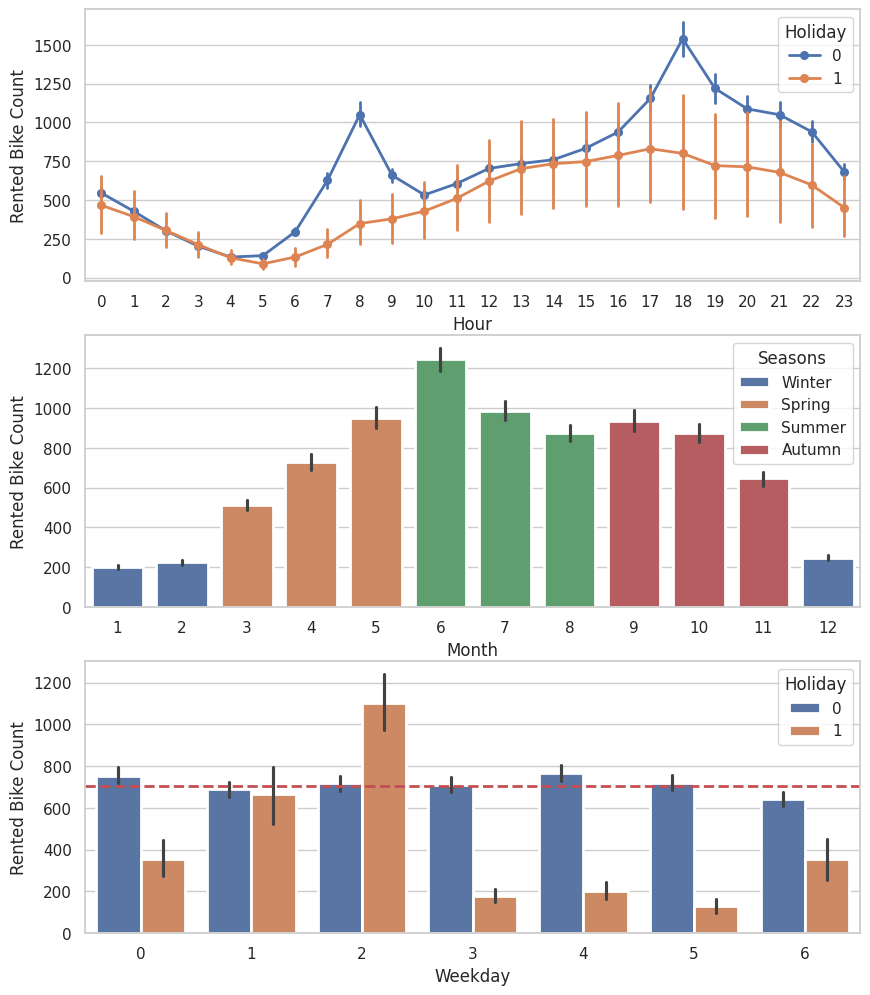

In [138]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(10,12), dpi=100)

promedio=np.mean(data['Rented Bike Count'])

sns.pointplot(data=data, x='Hour', y='Rented Bike Count', ax=axs[0], hue='Holiday', linewidth=2)
sns.barplot(data=data, x='Month', y='Rented Bike Count', ax=axs[1], linewidth=2, hue='Seasons')

sns.barplot(data=data, x='Weekday', y='Rented Bike Count', ax=axs[2], linewidth=2,hue='Holiday')
axs[2].axhline(promedio, color='r', linestyle='dashed', linewidth=2, label=f'Promedio: {promedio:.2f}')

sns.set(style="whitegrid")

Создадим новый датасет с группировкой данных по дню, и посчитаем сумму всех поездок в день и среднее значение по остальным данным. Далее построим некоторые визуализации.

In [22]:
data_day1=data.groupby(['Date'])[['Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Holiday',
       'Functioning Day', 'Season_Autumn', 'Season_Spring', 'Season_Summer',
       'Season_Winter', 'Year', 'Month', 'Day', 'Weekday']].mean()

In [140]:
data_day1[['Year', 'Month', 'Day', 'Holiday', 'Functioning Day','Season_Autumn', 'Season_Spring', 'Season_Summer',
       'Season_Winter']]=data_day1[['Year', 'Month', 'Day', 'Holiday', 'Functioning Day','Season_Autumn', 'Season_Spring', 'Season_Summer',
       'Season_Winter']].astype(int)

In [139]:
data_day1.head(5)

,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Functioning Day,Season_Autumn,Season_Spring,Season_Summer,Season_Winter,Year,Month,Day,Weekday
Date,,,,,,,,,,,,,,,,,,
2017-12-01,-2.454167,45.875000,1.537500,1870.750000,-13.545833,0.248750,0.000000,0.0,0,1,0,0,0,1,2017,12,1,4.0
2017-12-02,1.325000,61.958333,1.712500,1471.083333,-5.716667,0.263750,0.000000,0.0,0,1,0,0,0,1,2017,12,2,5.0
2017-12-03,4.875000,81.541667,1.612500,455.750000,1.883333,0.125417,0.166667,0.0,0,1,0,0,0,1,2017,12,3,6.0
2017-12-04,-0.304167,52.500000,3.450000,1362.833333,-9.925000,0.282917,0.004167,0.0,0,1,0,0,0,1,2017,12,4,0.0
2017-12-05,-4.458333,36.416667,1.108333,1959.458333,-17.425000,0.035833,0.000000,0.0,0,1,0,0,0,1,2017,12,5,1.0


In [24]:
data_day2=data.groupby(['Date'])[['Rented Bike Count']].apply(sum)
print(data_day2.head(5))

            Rented Bike Count
Date                         
2017-12-01               9539
2017-12-02               8523
2017-12-03               7222
2017-12-04               8729
2017-12-05               8307


In [25]:
data_day=pd.merge(left=data_day2,right=data_day1, how='left', left_on='Date', right_on='Date')

In [26]:
data_day = data_day.asfreq('D')
data_day = data_day.sort_index()
data_day.index

DatetimeIndex(['2017-12-01', '2017-12-02', '2017-12-03', '2017-12-04',
               '2017-12-05', '2017-12-06', '2017-12-07', '2017-12-08',
               '2017-12-09', '2017-12-10',
               ...
               '2018-11-21', '2018-11-22', '2018-11-23', '2018-11-24',
               '2018-11-25', '2018-11-26', '2018-11-27', '2018-11-28',
               '2018-11-29', '2018-11-30'],
              dtype='datetime64[ns]', name='Date', length=365, freq='D')

In [27]:
data_day.head()

,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Functioning Day,Season_Autumn,Season_Spring,Season_Summer,Season_Winter,Year,Month,Day,Weekday
Date,,,,,,,,,,,,,,,,,,,
2017-12-01,9539,-2.454167,45.875000,1.537500,1870.750000,-13.545833,0.248750,0.000000,0.0,0,1,0,0,0,1,2017,12,1,4.0
2017-12-02,8523,1.325000,61.958333,1.712500,1471.083333,-5.716667,0.263750,0.000000,0.0,0,1,0,0,0,1,2017,12,2,5.0
2017-12-03,7222,4.875000,81.541667,1.612500,455.750000,1.883333,0.125417,0.166667,0.0,0,1,0,0,0,1,2017,12,3,6.0
2017-12-04,8729,-0.304167,52.500000,3.450000,1362.833333,-9.925000,0.282917,0.004167,0.0,0,1,0,0,0,1,2017,12,4,0.0
2017-12-05,8307,-4.458333,36.416667,1.108333,1959.458333,-17.425000,0.035833,0.000000,0.0,0,1,0,0,0,1,2017,12,5,1.0


Построим линейный график количества поездок и температуры в течение изучаемого периода. Можем заметить прямую зависимости количества от температуры.

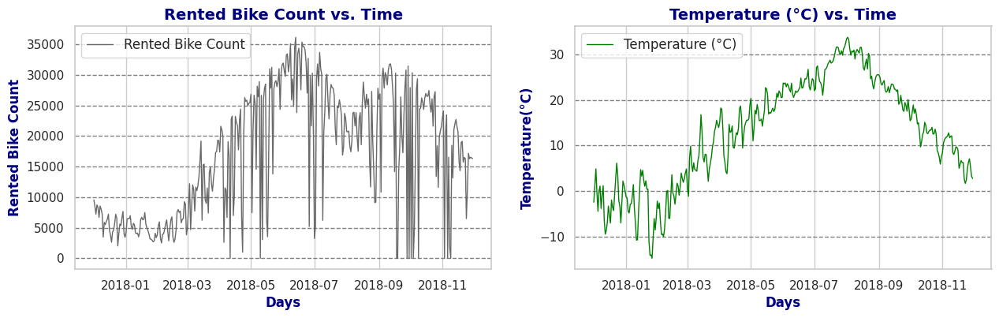

In [28]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

axes[0].plot(data_day.index,data_day['Rented Bike Count'], color = "dimgray", linewidth = 1, label='Rented Bike Count')
axes[1].plot(data_day.index,data_day['Temperature(°C)'], color = "green", linewidth = 1, label='Temperature (°C)')

axes[0].set_title('Rented Bike Count vs. Time', loc = "Center", fontdict = {'fontsize':14, 'fontweight':'bold', 'color':'navy'})
axes[0].set_xlabel("Days", fontdict = {'fontsize':12, 'fontweight':'bold', 'color':'navy'})
axes[0].set_ylabel("Rented Bike Count", fontdict = {'fontsize':12, 'fontweight':'bold', 'color':'navy'})
axes[0].legend(prop={'size': 12}, loc = 'upper left')
axes[0].grid(axis = 'y', color = 'gray', linestyle = 'dashed')

axes[1].set_title('Temperature (°C) vs. Time', loc = "Center", fontdict = {'fontsize':14, 'fontweight':'bold', 'color':'navy'})
axes[1].set_xlabel("Days", fontdict = {'fontsize':12, 'fontweight':'bold', 'color':'navy'})
axes[1].set_ylabel("Temperature(°C)", fontdict = {'fontsize':12, 'fontweight':'bold', 'color':'navy'})
axes[1].legend(prop={'size': 12}, loc = 'upper left')
axes[1].grid(axis = 'y', color = 'gray', linestyle = 'dashed')

plt.xticks(rotation=0)

plt.show()

## Profile report

In [29]:
profile=ProfileReport(data_day, title='Report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Pairplot и матрица корреляций.

Построим pairplot, чтобы выдвинуть гипотезы о взаимосвязи признаков.

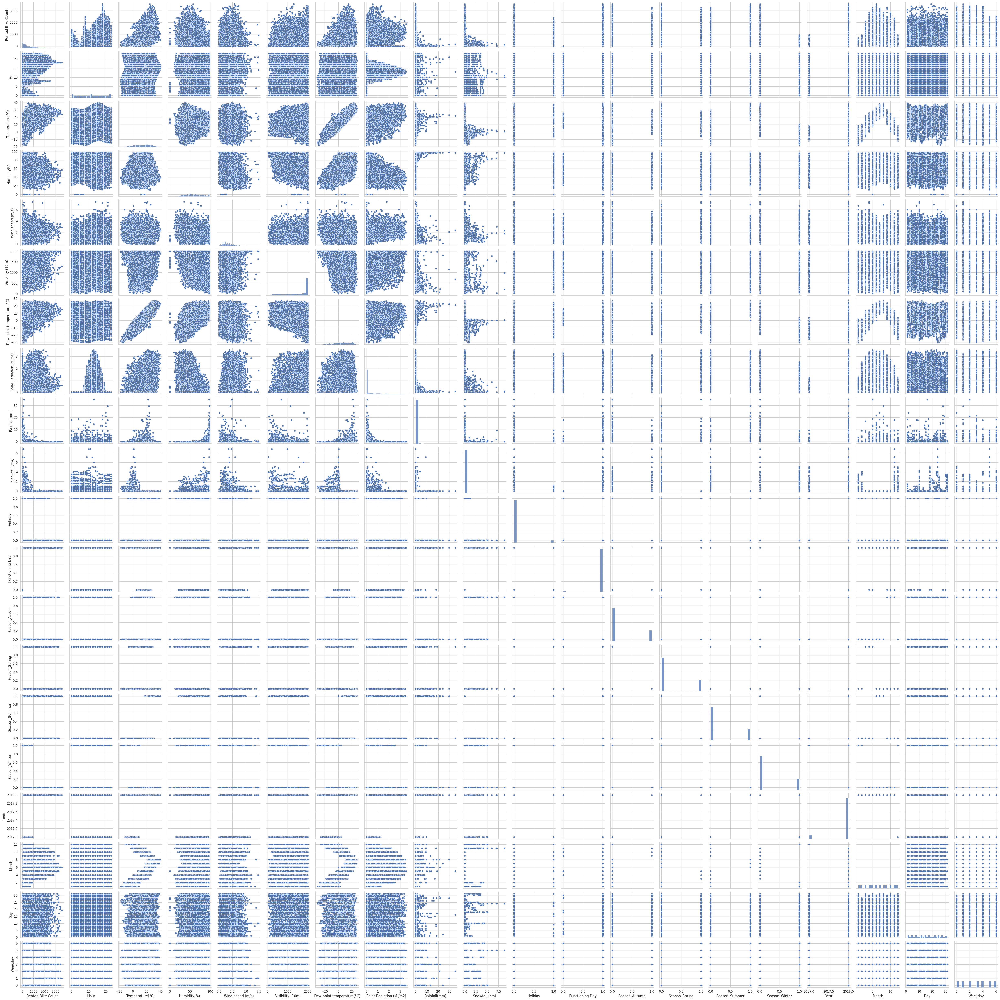

In [30]:
sns.pairplot(data)

Построим матрицу корреляций.



In [ ]:
plt.figure(figsize=(12, 6))

corr = data_day.corr(method='spearman')
sns.heatmap(corr, annot=True, cmap='coolwarm')

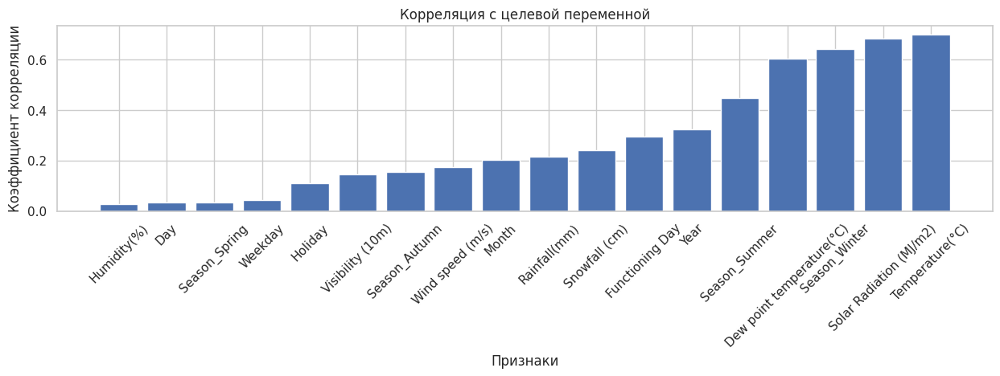

In [32]:
# вычисляем модуль корреляции
corr_with_target = data_day.corr()['Rented Bike Count'].abs().sort_values()

# удаляем корреляцию целевой переменной с самой собой
corr_with_target = corr_with_target.drop('Rented Bike Count')

# строим столбчатую диаграмму корреляций
plt.figure(figsize=(15, 3))
plt.bar(corr_with_target.index, corr_with_target.values)
plt.title('Корреляция с целевой переменной')
plt.xlabel('Признаки')
plt.ylabel('Коэффициент корреляции')
plt.xticks(rotation=45)
plt.show()

# Приступим к построению моделей регрессии.

## Подготовка данных.

Разделим выборку на тренировочную и тестовую и применим технику заполнения пропусков, которая основана на методе K ближайших соседей KNN.

In [33]:
from sklearn.model_selection import train_test_split

X = data.drop(['Seasons', 'Rented Bike Count', 'Date'], axis=1)
y = data['Rented Bike Count']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

Проведем стандартизацию данных.

In [34]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [35]:
print('Тренировочная выборка:\n', y_train.value_counts(normalize=True), sep='')
print('Тестовая выборка:\n', y_test.value_counts(normalize=True), sep='')

Тренировочная выборка:
Rented Bike Count
0       0.034551
223     0.002435
165     0.002283
189     0.002283
262     0.002283
          ...   
713     0.000152
2613    0.000152
1255    0.000152
1227    0.000152
2797    0.000152
Name: proportion, Length: 1990, dtype: float64
Тестовая выборка:
Rented Bike Count
0       0.031050
178     0.003196
71      0.002740
212     0.002740
38      0.002740
          ...   
158     0.000457
1046    0.000457
649     0.000457
457     0.000457
546     0.000457
Name: proportion, Length: 1190, dtype: float64


## Линейная регрессия.

In [36]:
from sklearn.linear_model import LinearRegression

linreg = LinearRegression()
linreg.fit(X_train, y_train)

print(linreg.coef_)
print(linreg.intercept_)

[ 196.01266516  213.26828473 -215.13990692   20.22801879    3.06764472
  126.63991938  -70.76719991  -67.78415375   13.53135816  -28.81954914
  175.87351665  169.49722206  -22.62153174   31.93236682 -181.47546184
 -168.15793475 -170.54180708   -9.84731848  -21.41152574]
705.7963470319286


In [37]:
linreg_df = pd.DataFrame({'Признаки': X.columns, 'Коэффициенты': linreg .coef_})

intercept_df = pd.DataFrame({'Признаки': ['Intercept'], 'Коэффициенты': linreg .intercept_})
coef_df = pd.concat([linreg_df, intercept_df], ignore_index=True)
coef_df

,Признаки,Коэффициенты
0,Hour,196.012665
1,Temperature(°C),213.268285
2,Humidity(%),-215.139907
3,Wind speed (m/s),20.228019
4,Visibility (10m),3.067645
5,Dew point temperature(°C),126.639919
6,Solar Radiation (MJ/m2),-70.767200
7,Rainfall(mm),-67.784154
8,Snowfall (cm),13.531358
9,Holiday,-28.819549


In [38]:
# Делаем предсказание для тренировочной выборки
y_train_predict_lr = linreg.predict(X_train)

# Делаем предсказание для тестовой выборки
y_test_predict_lr = linreg.predict(X_test)

Расчитаем основные коэффициенты модели.

In [39]:
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, r2_score
import numpy as np

In [85]:
r2_train_lr = r2_score(y_train, y_train_predict_lr)
n_train = X_train.shape[0]
k_train = X_train.shape[1]
r2_train_adj_lr = 1 - (1 - r2_train_lr) * (n_train - 1) / (n_train - k_train - 1)

r2_test_lr = r2_score(y_test, y_test_predict_lr)
n_test = X_test.shape[0]
k_test = X_test.shape[1]
r2_test_adj_lr = 1 - (1 - r2_test_lr) * (n_test - 1) / (n_test - k_test - 1)

print(f"Train R^2: {r2_score(y_train, y_train_predict_lr)}")
print(f"Train R^2 adjusted: {1 - (1 - r2_train_lr) * (n_train - 1) / (n_train - k_train - 1)}")
print(f"Train MAE: {mean_absolute_error(y_train, y_train_predict_lr)}")
print(f"Train MAPE: {mean_absolute_percentage_error(y_train, y_train_predict_lr)}")
print(f"Train MSE: {mean_squared_error(y_train, y_train_predict_lr)}")
print('__________________________________________________________________________________')
print(f"Test R^2: {r2_score(y_test, y_test_predict_lr)}")
print(f"Test R^2 adjusted: {1 - (1 - r2_test_lr) * (n_test - 1) / (n_test - k_test - 1)}")
print(f"Test MAE: {mean_absolute_error(y_test, y_test_predict_lr)}")
print(f"Test MAPE: {mean_absolute_percentage_error(y_test, y_test_predict_lr)}")
print(f"Test MSE: {mean_squared_error(y_test, y_test_predict_lr)}")

Train R^2: 0.5611865964519889
Train R^2 adjusted: 0.5599137026096359
Train MAE: 320.9589360469565
Train MAPE: 4.787032380863954e+16
Train MSE: 183523.30178233905
__________________________________________________________________________________
Test R^2: 0.5350892933259547
Test R^2 adjusted: 0.5310186465854907
Test MAE: 327.651379982568
Test MAPE: 4.8590415608616296e+16
Test MSE: 190241.91826836465


Test R^2 adjusted для тестовой выборки равен 0.53.

Посмотрим на распределение остатков

<Axes: xlabel='Rented Bike Count', ylabel='Count'>

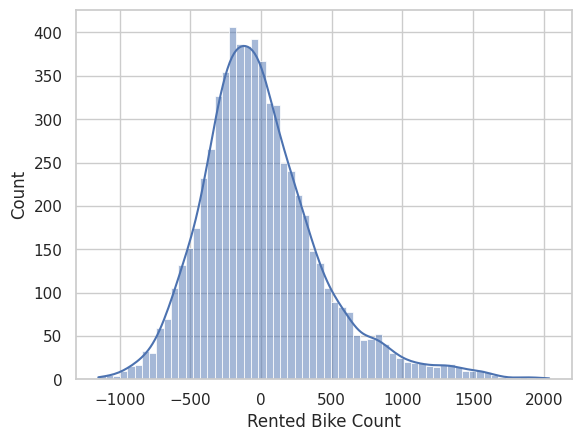

In [41]:
sns.histplot((y_train-y_train_predict_lr), kde=True)

<Axes: xlabel='Rented Bike Count', ylabel='Count'>

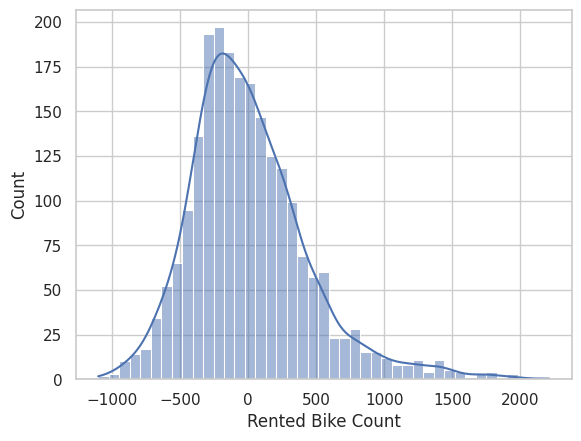

In [42]:
sns.histplot((y_test-y_test_predict_lr), kde=True)

Распределение остатков нормальное.

## Полиноминальная регрессия.

In [43]:
from sklearn.preprocessing import PolynomialFeatures

# Создаём генератор полиномиальных признаков
poly = PolynomialFeatures(degree=2, include_bias=False)

poly.fit(X_train)

# Генерируем полиномиальные признаки для тренировочной выборки
X_train_poly = poly.transform(X_train)

# Генерируем полиномиальные признаки для тестовой выборки
X_test_poly = poly.transform(X_test)

In [44]:
model_poly = LinearRegression()

model_poly.fit(X_train_poly, y_train)

y_train_predict_poly = model_poly.predict(X_train_poly)
y_test_predict_poly = model_poly.predict(X_test_poly)

In [77]:
r2_train_p = r2_score(y_train, y_train_predict_poly)
n_train = X_train.shape[0]
k_train = X_train.shape[1]
r2_train_p_adj = 1 - (1 - r2_train_p) * (n_train - 1) / (n_train - k_train - 1)

r2_test_p = r2_score(y_test, y_test_predict_poly)
n_test = X_test.shape[0]
k_test = X_test.shape[1]
r2_test_p_adj = 1 - (1 - r2_test_p) * (n_test - 1) / (n_test - k_test - 1)

print(f"Train R^2: {r2_score(y_train, y_train_predict_poly)}")
print(f"Train R^2 adjusted: {r2_train_p_adj}")
print(f"Train MAE: {mean_absolute_error(y_train, y_train_predict_poly)}")
print(f"Train MAPE: {mean_absolute_percentage_error(y_train, y_train_predict_poly)}")
print(f"Train MSE: {mean_squared_error(y_train, y_train_predict_poly)}")
print('__________________________________________________________________________________')
print(f"Test R^2: {r2_score(y_test, y_test_predict_poly)}")
print(f"Test R^2 adjusted: {r2_test_p_adj}")
print(f"Test MAE: {mean_absolute_error(y_test, y_test_predict_poly)}")
print(f"Test MAPE: {mean_absolute_percentage_error(y_test, y_test_predict_poly)}")
print(f"Test MSE: {mean_squared_error(y_test, y_test_predict_poly)}")

Train R^2: 0.7438648287830187
Train R^2 adjusted: 0.743121841263458
Train MAE: 233.61765601217655
Train MAPE: 1.6395296177693686e+16
Train MSE: 107122.46240487062
__________________________________________________________________________________
Test R^2: 0.6683254397263017
Test R^2 adjusted: 0.6654213767561633
Test MAE: 243.46118721461187
Test MAPE: 2.0301157772329468e+16
Test MSE: 135721.55616438357


Проведем регуляризацию.

In [46]:
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet

L-1-регуляризация (Lasso)

In [47]:
# Создаём список из 30 возможных значений от 0 до 2000
alpha_list = np.linspace(0, 2000, 30)

# Создаём пустые списки, в которые будем добавлять результаты
train_scores = []
test_scores = []

for alpha in alpha_list:
    # Создаём объект класса линейной регрессии с L1-регуляризацией
    lasso_lr_poly = Lasso(alpha=alpha)
    # Обучаем модель
    lasso_lr_poly.fit(X_train_poly, y_train)
    # Делаем предсказание для тренировочной выборки
    y_train_predict_poly = lasso_lr_poly.predict(X_train_poly)
    # Делаем предсказание для тестовой выборки
    y_test_predict_poly = lasso_lr_poly.predict(X_test_poly)
    # Рассчитываем коэффициенты детерминации для двух выборок и добавляем их в списки
    train_scores.append(r2_score(y_train, y_train_predict_poly))
    test_scores.append(r2_score(y_test, y_test_predict_poly))

<ipython-input-47-7d99267a0a0a>:12: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  lasso_lr_poly.fit(X_train_poly, y_train)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.519e+08, tolerance: 2.748e+05 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


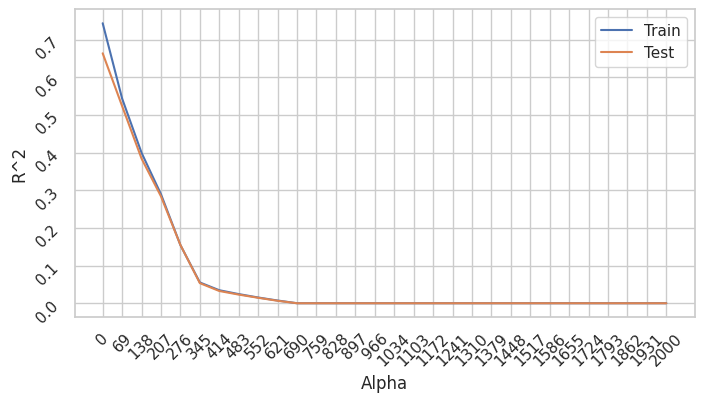

In [48]:
plt.figure(figsize=(8, 4))
plt.plot(alpha_list, train_scores, label='Train')
plt.plot(alpha_list, test_scores, label='Test')
plt.xlabel('Alpha')
plt.ylabel('R^2')
plt.xticks(alpha_list)
plt.tick_params(rotation=45)
plt.legend()
plt.show()

In [49]:
# Находим максимальный R2-score для тренировочной выборки и соответствующее alpha
max_train_score_index = np.argmax(train_scores)
max_train_alpha = alpha_list[max_train_score_index]
print(f"Максимальный R2-score для тренировочной выборки: {train_scores[max_train_score_index]} при alpha: {max_train_alpha}")

# Находим максимальный R2-score для тестовой выборки и соответствующее alpha
max_test_score_index = np.argmax(test_scores)
max_test_alpha = alpha_list[max_test_score_index]
print(f"Максимальный R2-score для тестовой выборки: {test_scores[max_test_score_index]} при alpha: {max_test_alpha}")

Максимальный R2-score для тренировочной выборки: 0.7438542223386952 при alpha: 0.0
Максимальный R2-score для тестовой выборки: 0.66396323822635 при alpha: 0.0


L2-регуляризация (Ridge)

In [50]:
alpha_list = np.linspace(0, 2000, 30)

# Создаём пустые списки, в которые будем добавлять результаты
train_scores = []
test_scores = []

for alpha in alpha_list:
    # Создаём объект класса линейной регрессии с L1-регуляризацией
    ridge_lr_poly = Ridge(alpha=alpha)
    # Обучаем модель
    ridge_lr_poly.fit(X_train_poly, y_train)
    # Делаем предсказание для тренировочной выборки
    y_train_predict_poly = ridge_lr_poly.predict(X_train_poly)
    # Делаем предсказание для тестовой выборки
    y_test_predict_poly = ridge_lr_poly.predict(X_test_poly)
    # Рассчитываем коэффициенты детерминации для двух выборок и добавляем их в списки
    train_scores.append(r2_score(y_train, y_train_predict_poly))
    test_scores.append(r2_score(y_test, y_test_predict_poly))

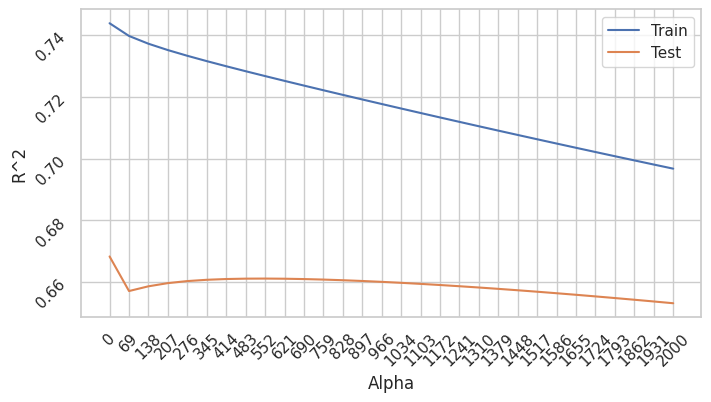

In [51]:
plt.figure(figsize=(8, 4))
plt.plot(alpha_list, train_scores, label='Train')
plt.plot(alpha_list, test_scores, label='Test')
plt.xlabel('Alpha')
plt.ylabel('R^2')
plt.xticks(alpha_list)
plt.tick_params(rotation=45)
plt.legend()
plt.show()

In [52]:
# Находим максимальный R2-score для тренировочной выборки и соответствующее alpha
max_train_score_index = np.argmax(train_scores)
max_train_alpha_r = alpha_list[max_train_score_index]
print(f"Максимальный R2-score для тренировочной выборки: {train_scores[max_train_score_index]} при alpha: {max_train_alpha}")

# Находим максимальный R2-score для тестовой выборки и соответствующее alpha
max_test_score_index = np.argmax(test_scores)
max_test_alpha_r = alpha_list[max_test_score_index]
print(f"Максимальный R2-score для тестовой выборки: {test_scores[max_test_score_index]} при alpha: {max_test_alpha}")

Максимальный R2-score для тренировочной выборки: 0.7438648287830187 при alpha: 0.0
Максимальный R2-score для тестовой выборки: 0.6683254397263017 при alpha: 0.0


Elastic Net регуляризация

In [53]:
# Создаем список из 15 возможных значений от 0 до 1 для l1_ratio

l1_ratio_list = np.linspace(0, 1, 15)

# Инициализируем переменные для сохранения лучших результатов
best_train_score = -np.inf
best_test_score = -np.inf
best_train_params = (None, None)
best_test_params = (None, None)

# Перебираем значения l1_ratio и alpha
for l1_ratio in l1_ratio_list:
    alpha_list = np.linspace(0, 2000, 30)
    for alpha in alpha_list:
        elastic_net_lr = ElasticNet(alpha=alpha, l1_ratio=l1_ratio)
        elastic_net_lr.fit(X_train_poly, y_train)
        y_train_pred = elastic_net_lr.predict(X_train_poly)
        y_test_pred = elastic_net_lr.predict(X_test_poly)
        train_score = r2_score(y_train, y_train_pred)
        test_score = r2_score(y_test, y_test_pred)

        # Сохраняем параметры, если они лучше предыдущих
        if train_score > best_train_score:
            best_train_score = train_score
            best_train_params = (alpha, l1_ratio)
        if test_score > best_test_score:
            best_test_score = test_score
            best_test_params = (alpha, l1_ratio)

# Выводим лучшие результаты
print(f'Лучший R^2 для тренировочной выборки: {best_train_score}, alpha: {best_train_params[0]}, l1_ratio: {best_train_params[1]}')
print(f'Лучший R^2 для тестовой выборки: {best_test_score}, alpha: {best_test_params[0]}, l1_ratio: {best_test_params[1]}')

<ipython-input-53-404c594c6622>:16: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  elastic_net_lr.fit(X_train_poly, y_train)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.519e+08, tolerance: 2.748e+05 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/di

Лучший R^2 для тренировочной выборки: 0.7438542223386952, alpha: 0.0, l1_ratio: 0.0
Лучший R^2 для тестовой выборки: 0.66396323822635, alpha: 0.0, l1_ratio: 0.0


Обучим полиноминальную модель с применением регуляризации Ridge, при которой наилучшие результаты для Test.

In [ ]:
ridge_lr_poly = Ridge(alpha=max_test_alpha_r)

# Обучаем модель
ridge_lr_poly.fit(X_train_poly, y_train)

# Делаем предсказание для тренировочной выборки
y_train_predict_poly = ridge_lr_poly.predict(X_train_poly)

# Делаем предсказание для тестовой выборки
y_test_predict_poly = ridge_lr_poly.predict(X_test_poly)

# Рассчитываем коэффициент детерминации для двух выборок
print(f"R^2 на тренировочной выборке: {r2_score(y_train, y_train_predict_poly) :.3f}")
print(f"R^2 на тестовой выборке: {r2_score(y_test, y_test_predict_poly) :.3f}")

Посмотрим на распределение остатков

In [ ]:
sns.histplot((y_train-y_train_predict_poly), kde=True)

In [ ]:
sns.histplot((y_test-y_test_predict_poly), kde=True)

## Random Forest.

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
modelo_rf = RandomForestRegressor(
            n_estimators = 500,
            criterion    = 'squared_error',
            max_depth    = None,
            max_features = 5,
            oob_score    = False,
            n_jobs       = -1,
            random_state = 42
         )

modelo_rf.fit(X_train, y_train)

In [ ]:
pred_rf_train = modelo_rf.predict(X_train).round()
pred_rf_test = modelo_rf.predict(X_test).round()

Расчитаем основные коэффициенты модели.

In [88]:
r2_train_rf = r2_score(y_train, pred_rf_train)
n_train = X_train.shape[0]
k_train = X_train.shape[1]
r2_train_adj_rf = 1 - (1 - r2_train_rf) * (n_train - 1) / (n_train - k_train - 1)

r2_test_rf = r2_score(y_test, pred_rf_test)
n_test = X_test.shape[0]
k_test = X_test.shape[1]
r2_test_adj_rf = 1 - (1 - r2_test_rf) * (n_test - 1) / (n_test - k_test - 1)

print(f"Train R^2: {r2_score(y_train, pred_rf_train)}")
print(f"Train R^2 adjusted: {1 - (1 - r2_train_rf) * (n_train - 1) / (n_train - k_train - 1)}")
print(f"Train MAE: {mean_absolute_error(y_train, pred_rf_train)}")
print(f"Train MAPE: {mean_absolute_percentage_error(y_train, pred_rf_train)}")
print(f"Train MSE: {mean_squared_error(y_train, pred_rf_train)}")
print('__________________________________________________________________________________')
print(f"Test R^2: {r2_score(y_test, pred_rf_test)}")
print(f"Test R^2 adjusted: {1 - (1 - r2_test_rf) * (n_test - 1) / (n_test - k_test - 1)}")
print(f"Train MAE: {mean_absolute_error(y_test, pred_rf_test)}")
print(f"Train MAPE: {mean_absolute_percentage_error(y_test, pred_rf_test)}")
print(f"Train MSE: {mean_squared_error(y_test, pred_rf_test)}")

Train R^2: 0.9887639924330204
Train R^2 adjusted: 0.9887313994339711
Train MAE: 42.93622526636225
Train MAPE: 5314521752055320.0
Train MSE: 4699.1937595129375
__________________________________________________________________________________
Test R^2: 0.9054402795135089
Test R^2 adjusted: 0.9046123372604014
Train MAE: 118.91324200913242
Train MAPE: 1.2533990743754874e+16
Train MSE: 38693.93059360731


Значение Test R^2 adjusted для тестовой выборки равно 0.904.

Просчитаем самые важные признаки для модели.

In [ ]:
modelo_rf.feature_importances_

In [ ]:
feature = X.columns #признаки
feature_list = list(feature)
feature_importances = modelo_rf.feature_importances_ #важность признаков
plt.figure(figsize=(8, 5))

# Строим столбчатую диаграмму
sns.barplot(x=feature, y=feature_importances)

# Добавляем подпись графику, осям абсцисс и ординат
plt.title('Важность признаков')
plt.xlabel('Признаки')
plt.ylabel('Важность')
plt.xticks(rotation=45)
plt.show()

In [ ]:
importances = list(modelo_rf.feature_importances_)
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Посмотрим настройку гипер параметров по умолчанию.

In [ ]:
print('Гипер параметры модели, по умолчанию":\n')
pprint(modelo_rf.get_params())

С помощью функции RandomizedSearchCV выведем наилучшие гипер параметры для модели.

In [ ]:
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]
random_state = [int(x) for x in np.linspace(10, 200, num = 20)]

In [ ]:
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
               'random_state':random_state}
pprint(random_grid)

In [ ]:
rf_random = RandomizedSearchCV(estimator = modelo_rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, n_jobs = -1)

In [ ]:
rf_random.fit(X_train, y_train)

In [70]:
print("Наилучшие гипер параметры для модели:")
rf_random.best_params_

Наилучшие гипер параметры для модели:


{'random_state': 40,
 'n_estimators': 1000,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 110,
 'bootstrap': True}

Сгенерируем модель с улучшенной конфигурацией гипер параметров.

In [71]:
modelo_rf_best = RandomForestRegressor(
            n_estimators = 1000,
            min_samples_split = 2,
            min_samples_leaf = 1,
            max_depth    = 110,
            max_features = 'auto',
            oob_score    = False,
            bootstrap = True,
            n_jobs       = -1,
            random_state = 40
         )


modelo_rf_best.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


RandomForestRegressor(max_depth=110, max_features='auto', n_estimators=1000,
                      n_jobs=-1, random_state=40)

In [72]:
pred_rf_best_train = modelo_rf_best.predict(X_train).round()
pred_rf_best_test = modelo_rf_best.predict(X_test).round()

In [89]:
r2_train_rfb = r2_score(y_train, pred_rf_best_train)
n_train = X_train.shape[0]
k_train = X_train.shape[1]
r2_train_adj_rfb = 1 - (1 - r2_train) * (n_train - 1) / (n_train - k_train - 1)

r2_test_rfb = r2_score(y_test, pred_rf_best_test)
n_test = X_test.shape[0]
k_test = X_test.shape[1]
r2_test_adj_rfb = 1 - (1 - r2_test) * (n_test - 1) / (n_test - k_test - 1)

print(f"Train R^2: {r2_score(y_train, pred_rf_best_train)}")
print(f"Train R^2 adjusted: {1 - (1 - r2_train_rfb) * (n_train - 1) / (n_train - k_train - 1)}")
print(f"Train MAE: {mean_absolute_error(y_train, pred_rf_best_train)}")
print(f"Train MAPE: {mean_absolute_percentage_error(y_train, pred_rf_best_train)}")
print(f"Train MSE: {mean_squared_error(y_train, pred_rf_best_train)}")
print('__________________________________________________________________________________')
print(f"Test R^2: {r2_score(y_test, pred_rf_best_test)}")
print(f"Test R^2 adjusted: {1 - (1 - r2_test_rfb) * (n_test - 1) / (n_test - k_test - 1)}")
print(f"Test MAE: {mean_absolute_error(y_test, pred_rf_best_test)}")
print(f"Test MAPE: {mean_absolute_percentage_error(y_test, pred_rf_best_test)}")
print(f"Test MSE: {mean_squared_error(y_test, pred_rf_best_test)}")

Train R^2: 0.9908472248309892
Train R^2 adjusted: 0.9908206747961478
Train MAE: 35.88188736681887
Train MAPE: 2199017900244224.0
Train MSE: 3827.931202435312
__________________________________________________________________________________
Test R^2: 0.9237037657626124
Test R^2 adjusted: 0.9230357342185984
Test MAE: 99.81643835616438
Test MAPE: 8236034934985770.0
Test MSE: 31220.49406392694


После применения функции по просчету наилучших гипер параметров для модели, мы добились значения Test R^2 adjusted: 0.92 для тестовой выборки.

Посмотрим на распределение остатков

<Axes: xlabel='Rented Bike Count', ylabel='Count'>

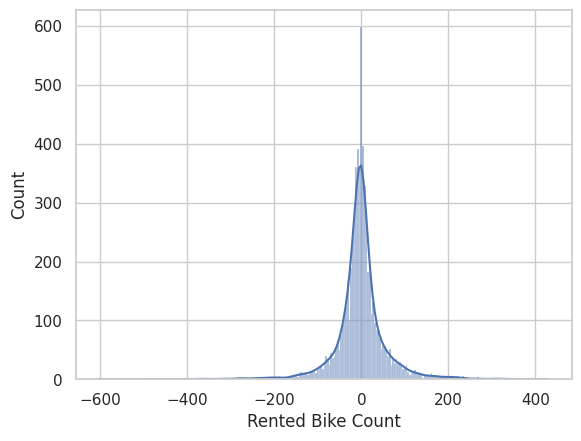

In [74]:
sns.histplot((y_train-pred_rf_best_train), kde=True)

<Axes: xlabel='Rented Bike Count', ylabel='Count'>

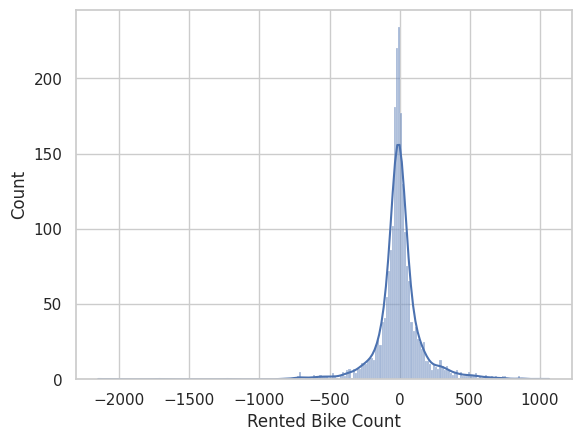

In [75]:
sns.histplot((y_test-pred_rf_best_test), kde=True)

Распределение остатков нормальное.

# Результаты

Вычесленные коэффициенты для моделей:

In [118]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-
#
#  format.py
#
Listas = [
['Linear regression', r2_score(y_test, y_test_predict_lr).round(2), r2_test_adj_lr.round(2), mean_squared_error(y_test, y_test_predict_lr).round(2)],
['Polynomial regression',  r2_score(y_test, y_test_predict_poly).round(2), r2_test_p_adj.round(2), mean_squared_error(y_test, y_test_predict_poly).round(2)],
['Random Forest',  r2_score(y_test, pred_rf_best_test).round(2), r2_test_adj_rfb.round(2), mean_squared_error(y_test, pred_rf_best_test).round(2)]
        ]
Tabla = """\
+-----------------------------------------------------------+
| Regression type            R^2    R^2_adj        MSE      |
|-----------------------------------------------------------|
{}
+-----------------------------------------------------------+\
"""
Tabla = (Tabla.format('\n'.join("| {:<26} {:<7} {:<10}  {:<5}  |".format(*fila)
 for fila in Listas)))
print("Вычесленные коэффициенты для моделей:")
print (Tabla)

Вычесленные коэффициенты для моделей:
+-----------------------------------------------------------+
| Regression type            R^2    R^2_adj        MSE      |
|-----------------------------------------------------------|
| Linear regression          0.54    0.53        190241.92  |
| Polynomial regression      0.67    0.67        135721.56  |
| Random Forest              0.92    0.92        31220.49  |
+-----------------------------------------------------------+
